# Experiment 2: Comparing model performance as dataset size changes

In this experiment, we'll evaluate how model accuracy depends on the size of the dataset used to train the model. We'll again use three simple CV datasets, MNIST, Fashion-MNIST, and CIFAR-10. 

#### Imports and Setup

In [1]:
import os
import sys
notebook_dir = os.getcwd()
project_root = os.path.abspath(os.path.join(notebook_dir, '..', '..')) # Adjust as needed
if project_root not in sys.path:
    sys.path.append(project_root) # add notebook to sys.path

In [ ]:
import torch
import matplotlib.pyplot as plt

from utils.train import fit, val_stats
from utils.hparams import (LogisticRegressionHyperParameters, 
                         MLPHyperParameters, 
                         CNNHyperParameters)

In [3]:
device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
print(f"Using {device} device")

Using mps device


In [4]:
dataset_sizes = [min(60_000, 2**n) for n in range(6, 17)]
print(dataset_sizes)
num_epochs = [int(max(5, 5 * (1.25)**(n))) for n in range(8,-3,-1)]
print(num_epochs)

[64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 60000]
[29, 23, 19, 15, 12, 9, 7, 6, 5, 5, 5]


In [5]:
lr_val_accuracies = [[],[],[]]
mlp_val_accuracies = [[],[],[]]
cnn_val_accuracies = [[],[],[]]

### MNIST Experiments

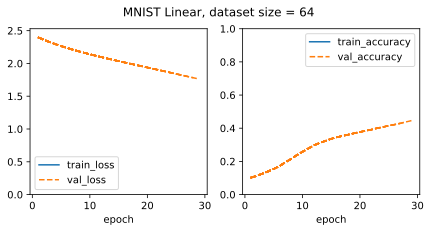

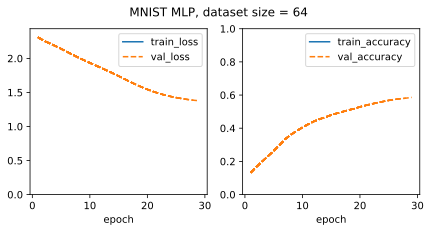

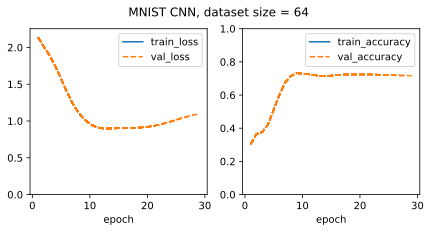

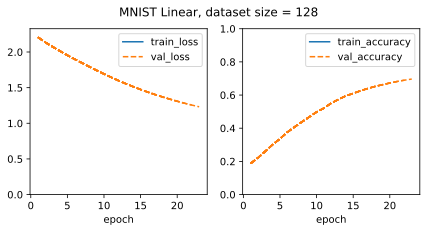

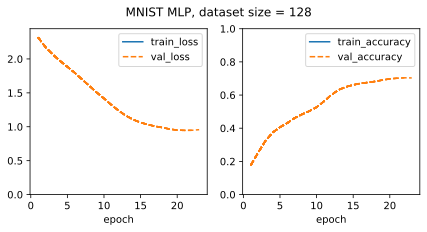

...

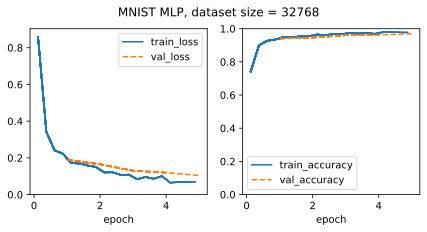

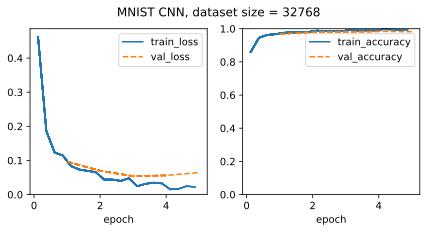

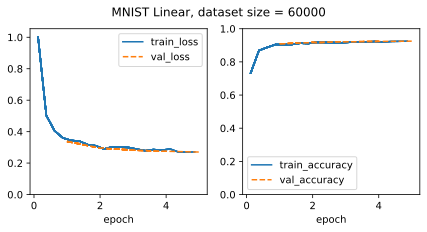

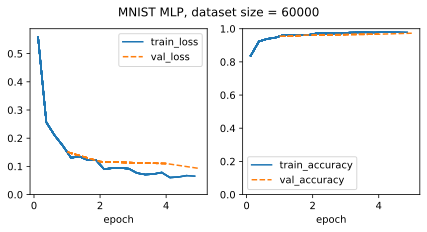

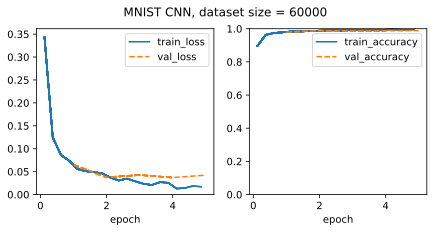

In [6]:
for dataset_size, epochs in zip(dataset_sizes, num_epochs):
    lr_hp = LogisticRegressionHyperParameters(dataset='MNIST', 
                                            id=f'MNIST Linear, ' \
                                            f'dataset size = {dataset_size}',
                                             dataset_size = dataset_size,
                                             num_epochs=epochs,)
    mlp_hp = MLPHyperParameters(dataset='MNIST', 
                                id=f'MNIST MLP, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    cnn_hp = CNNHyperParameters(dataset='MNIST', 
                                id=f'MNIST CNN, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    lr_model = fit(lr_hp, device=device)
    mlp_model = fit(mlp_hp, device=device)
    cnn_model = fit(cnn_hp, device=device)
    _, lr_val_accuracy = val_stats(lr_model, lr_hp, device=device)
    _, mlp_val_accuracy = val_stats(mlp_model, mlp_hp, device=device)
    _, cnn_val_accuracy = val_stats(cnn_model, cnn_hp, device=device)
    lr_val_accuracies[0].append(lr_val_accuracy)
    mlp_val_accuracies[0].append(mlp_val_accuracy)
    cnn_val_accuracies[0].append(cnn_val_accuracy)

In [7]:
print(f"Linear model, number of parameters: {lr_model.num_params}")
print(f"MLP, number of parameters: {mlp_model.num_params}")
print(f"CNN, number of parameters: {cnn_model.num_params}")

Linear model, number of parameters: 7850
MLP, number of parameters: 59210
CNN, number of parameters: 404074


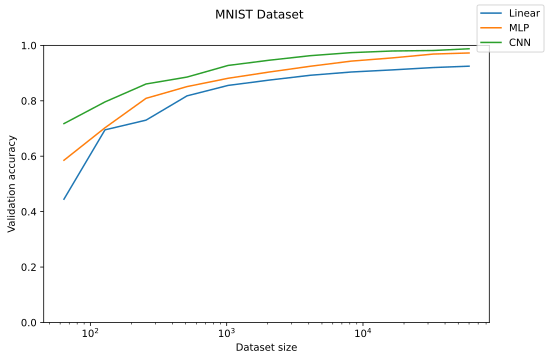

In [16]:
fig, axs = plt.subplots(figsize=(8, 5))
axs.plot(dataset_sizes, lr_val_accuracies[0], label="Linear")
axs.plot(dataset_sizes, mlp_val_accuracies[0], label="MLP")
axs.plot(dataset_sizes, cnn_val_accuracies[0], label="CNN")
axs.set_xlabel("Dataset size")
axs.set_ylabel("Validation accuracy")
axs.set_xscale('log')
axs.set_ylim([0,1])
fig.suptitle('MNIST Dataset')
fig.legend();

### Fashion-MNIST Experiments

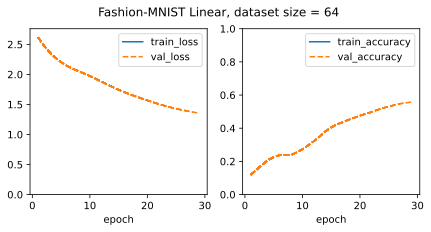

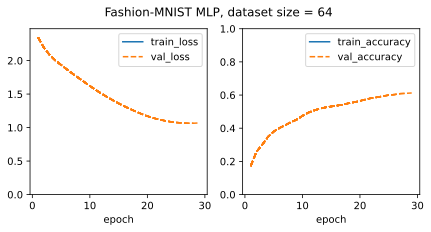

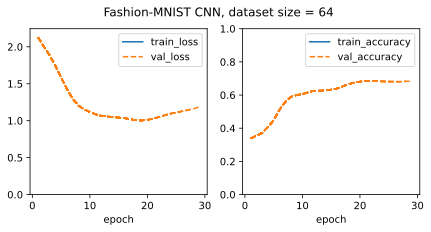

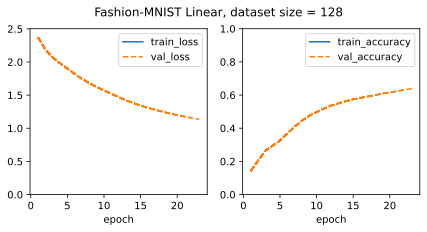

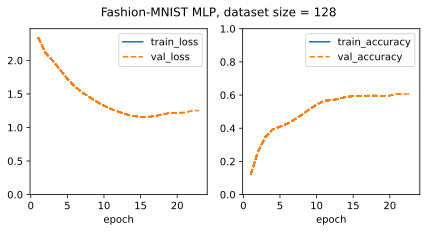

...

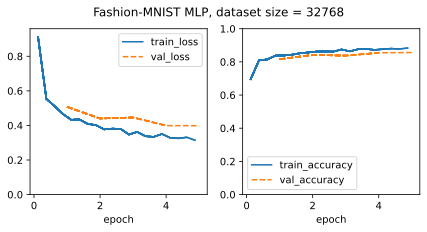

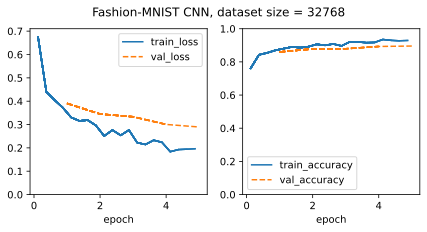

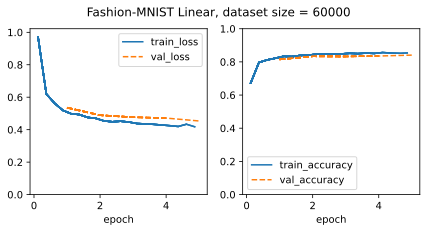

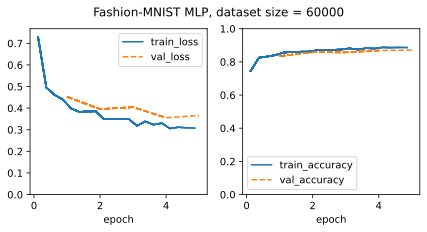

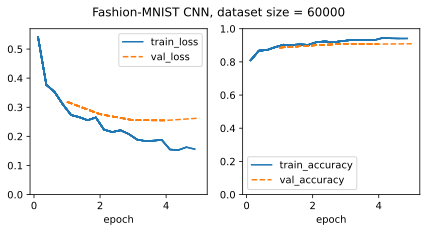

In [9]:
for dataset_size, epochs in zip(dataset_sizes, num_epochs):
    lr_hp = LogisticRegressionHyperParameters(dataset='FashionMNIST', 
                                            id=f'Fashion-MNIST Linear, ' \
                                            f'dataset size = {dataset_size}',
                                             dataset_size = dataset_size,
                                             num_epochs=epochs,)
    mlp_hp = MLPHyperParameters(dataset='FashionMNIST', 
                                id=f'Fashion-MNIST MLP, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    cnn_hp = CNNHyperParameters(dataset='FashionMNIST', 
                                id=f'Fashion-MNIST CNN, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    lr_model = fit(lr_hp, device=device)
    mlp_model = fit(mlp_hp, device=device)
    cnn_model = fit(cnn_hp, device=device)
    _, lr_val_accuracy = val_stats(lr_model, lr_hp, device=device)
    _, mlp_val_accuracy = val_stats(mlp_model, mlp_hp, device=device)
    _, cnn_val_accuracy = val_stats(cnn_model, cnn_hp, device=device)
    lr_val_accuracies[1].append(lr_val_accuracy)
    mlp_val_accuracies[1].append(mlp_val_accuracy)
    cnn_val_accuracies[1].append(cnn_val_accuracy)

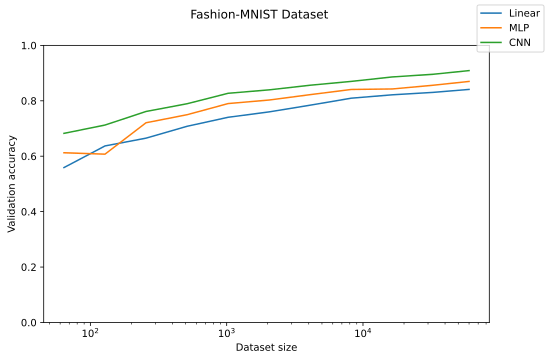

In [15]:
fig, axs = plt.subplots(figsize=(8, 5))
axs.plot(dataset_sizes, lr_val_accuracies[1], label="Linear")
axs.plot(dataset_sizes, mlp_val_accuracies[1], label="MLP")
axs.plot(dataset_sizes, cnn_val_accuracies[1], label="CNN")
axs.set_xlabel("Dataset size")
axs.set_ylabel("Validation accuracy")
axs.set_xscale('log')
axs.set_ylim([0,1])
fig.suptitle('Fashion-MNIST Dataset')
fig.legend();

### CIFAR-10 Experiments

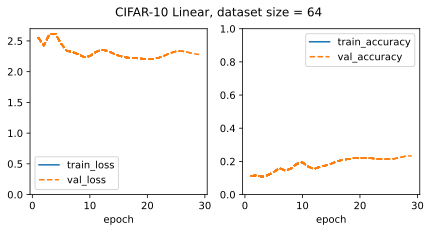

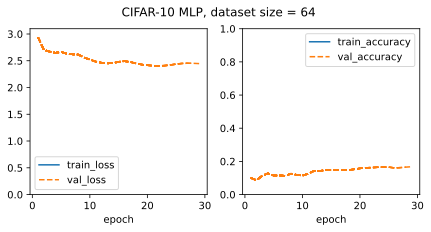

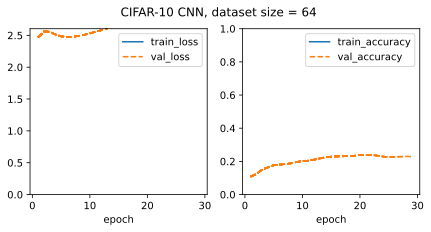

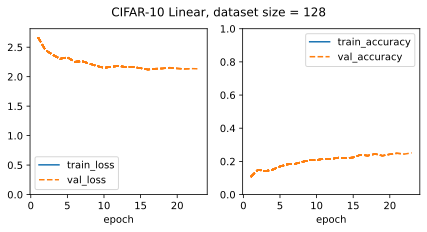

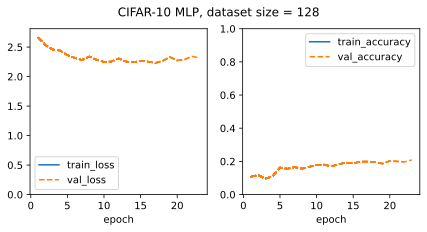

...

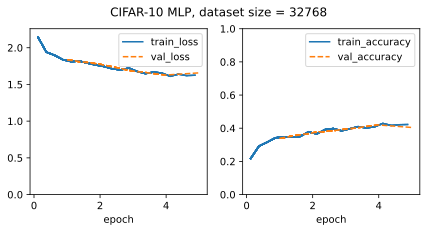

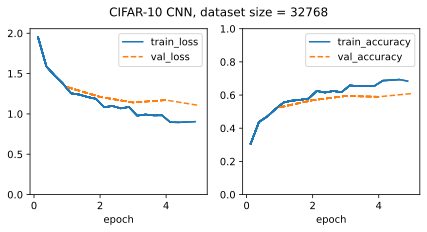

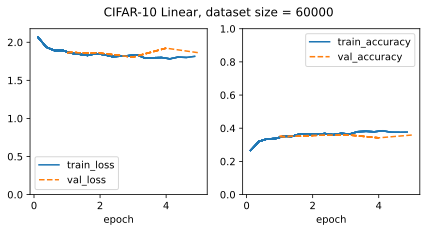

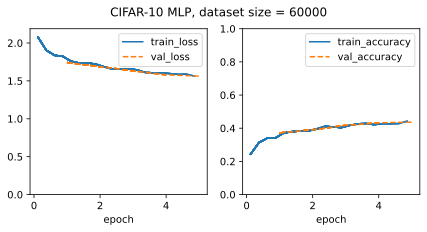

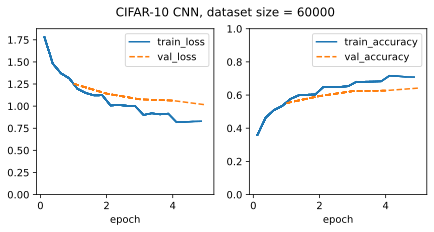

In [11]:
for dataset_size, epochs in zip(dataset_sizes, num_epochs):
    lr_hp = LogisticRegressionHyperParameters(dataset='CIFAR10', 
                                            id=f'CIFAR-10 Linear, ' \
                                            f'dataset size = {dataset_size}',
                                             dataset_size = dataset_size,
                                             num_epochs=epochs,)
    mlp_hp = MLPHyperParameters(dataset='CIFAR10', 
                                id=f'CIFAR-10 MLP, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    cnn_hp = CNNHyperParameters(dataset='CIFAR10', 
                                id=f'CIFAR-10 CNN, dataset size = {dataset_size}',
                                dataset_size = dataset_size,
                                num_epochs=epochs,)
    lr_model = fit(lr_hp, device=device)
    mlp_model = fit(mlp_hp, device=device)
    cnn_model = fit(cnn_hp, device=device)
    _, lr_val_accuracy = val_stats(lr_model, lr_hp, device=device)
    _, mlp_val_accuracy = val_stats(mlp_model, mlp_hp, device=device)
    _, cnn_val_accuracy = val_stats(cnn_model, cnn_hp, device=device)
    lr_val_accuracies[2].append(lr_val_accuracy)
    mlp_val_accuracies[2].append(mlp_val_accuracy)
    cnn_val_accuracies[2].append(cnn_val_accuracy)

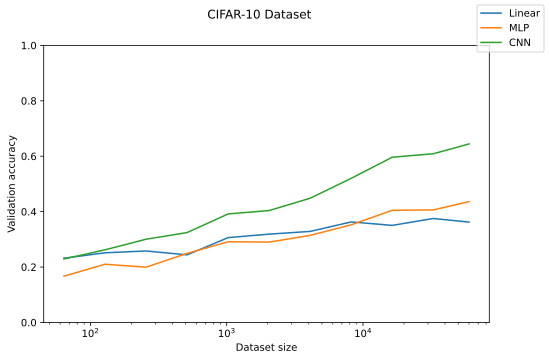

In [13]:
fig, axs = plt.subplots(figsize=(8, 5))
axs.plot(dataset_sizes, lr_val_accuracies[2], label="Linear")
axs.plot(dataset_sizes, mlp_val_accuracies[2], label="MLP")
axs.plot(dataset_sizes, cnn_val_accuracies[2], label="CNN")
axs.set_xlabel("Dataset size")
axs.set_ylabel("Validation accuracy")
axs.set_xscale('log')
axs.set_ylim([0,1])
fig.suptitle('CIFAR-10 Dataset')
fig.legend();